In [1]:
# Image processing_assignment

In [38]:
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

In [27]:
pic_h= Image.open("../hill.jpg")
pic_h.size

(1920, 1080)

In [28]:
pic_h.mode

'RGB'

In [88]:
pic_h.format

'JPEG'

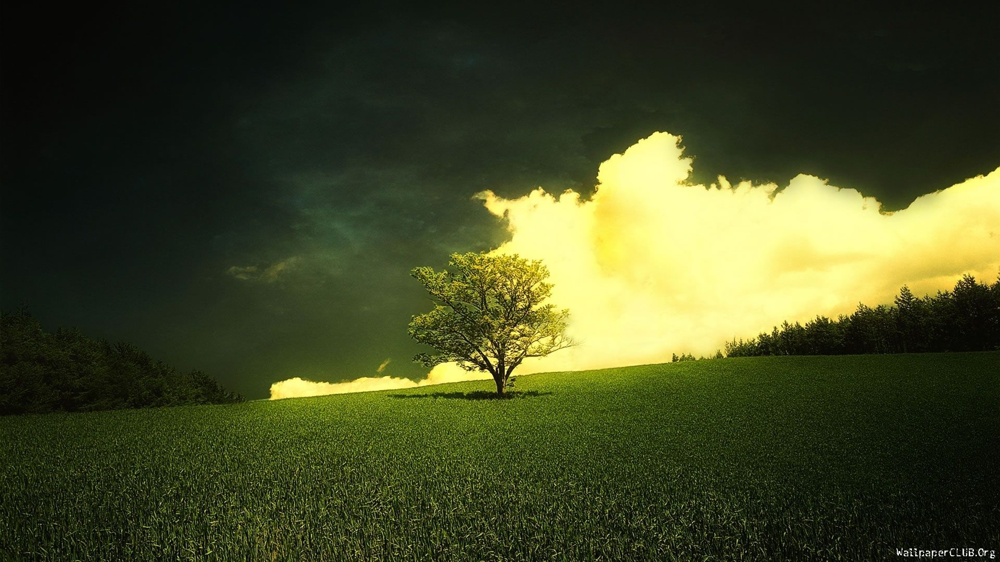

In [30]:
pic_h

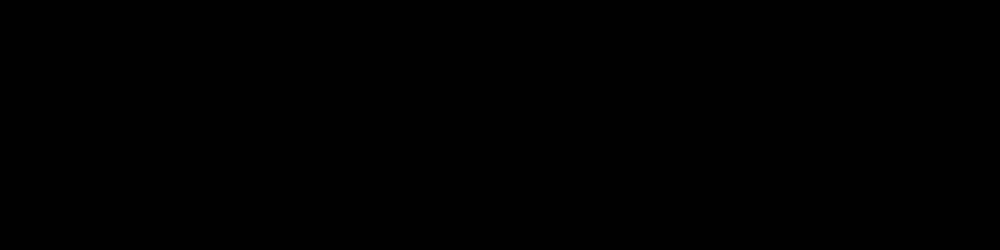

In [32]:
# Crop the image 
cp= pic_h.crop(box=[1000,2000,3000,2500])
cp

In [46]:
# converting the picture into array to GET RGB array format
# to know the x and y corodinates
pic_array=np.array(pic_h)
type(cp), type(pic_array)

(PIL.Image.Image, numpy.ndarray)

In [47]:
pic_array

array([[[ 7,  7,  5],
        [ 7,  7,  5],
        [ 6,  6,  4],
        ...,
        [13, 16,  9],
        [13, 16,  9],
        [13, 16,  9]],

       [[ 7,  7,  5],
        [ 7,  7,  5],
        [ 6,  6,  4],
        ...,
        [13, 16,  9],
        [13, 16,  9],
        [13, 16,  9]],

       [[ 7,  7,  5],
        [ 7,  7,  5],
        [ 6,  6,  4],
        ...,
        [13, 16,  9],
        [13, 16,  9],
        [13, 16,  9]],

       ...,

       [[29, 37, 22],
        [19, 28, 11],
        [ 3, 12,  0],
        ...,
        [ 5,  6,  0],
        [ 8,  9,  3],
        [23, 24, 18]],

       [[24, 32, 17],
        [14, 23,  6],
        [14, 23,  6],
        ...,
        [10, 11,  5],
        [ 9, 10,  4],
        [14, 15,  9]],

       [[15, 23,  8],
        [ 8, 17,  0],
        [23, 32, 15],
        ...,
        [16, 17, 11],
        [13, 14,  8],
        [ 9, 10,  4]]], dtype=uint8)

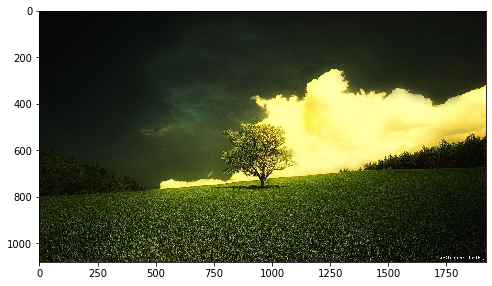

In [62]:
# USe pyplot to convert the MATRIX to an image
# here we converted the image into array of matrix.

plt.imshow(pic_array)
plt.gcf().set_size_inches(8,8)

In [57]:
pic_h.size

(1920, 1080)

In [58]:
# now crop specific area from the IMAGE
tree= pic_h.crop(box=[750,400,1150,790])  # upper left x, y and Lower right x,y

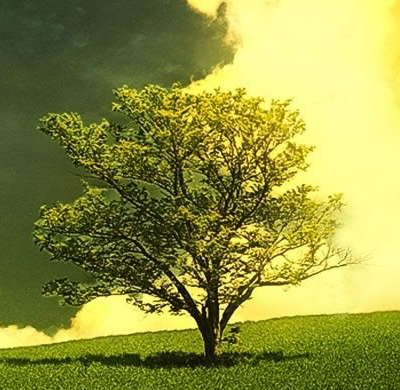

In [59]:
tree

In [76]:
# convert image into grayscale
pc_san= Image.open("../bros.jpg")

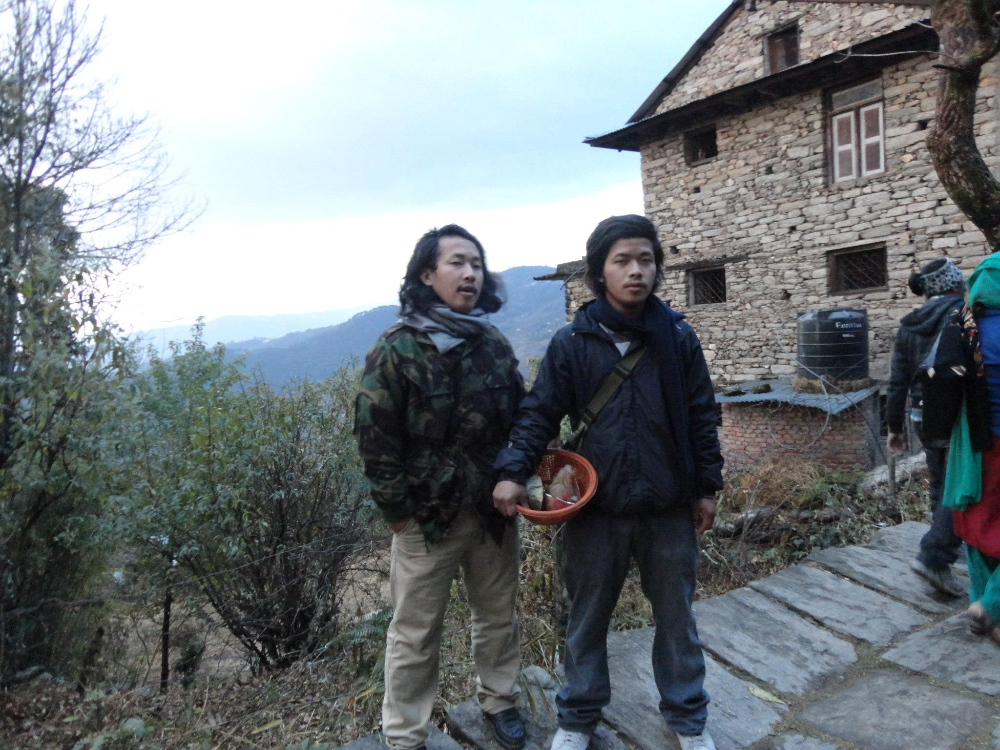

In [77]:
pc_san

In [78]:
# convert to array to get RGB
pc_san_array= np.array(pc_san)

In [79]:
gray_scale= pc_san.convert("L")

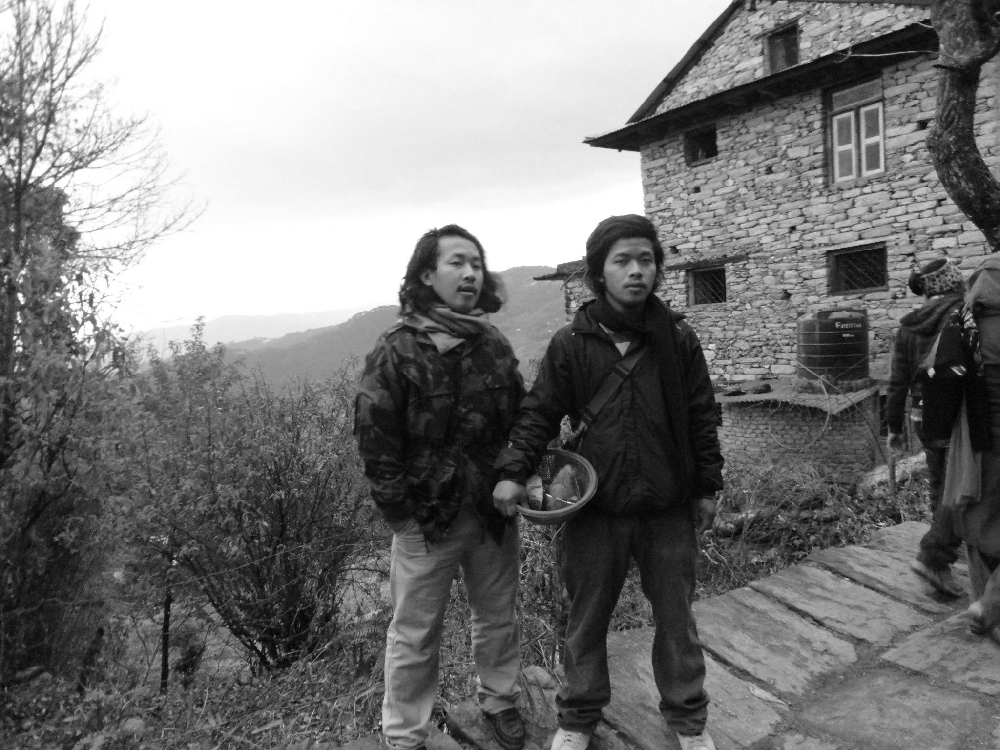

In [80]:
gray_scale

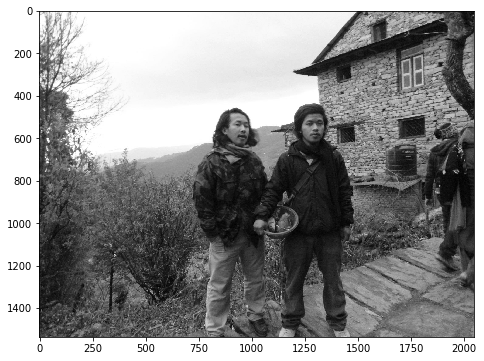

In [81]:
ar= np.array(gray_scale)
plt.imshow(ar, cmap='gray')
# color the border line

plt.gcf().set_size_inches(10,6)

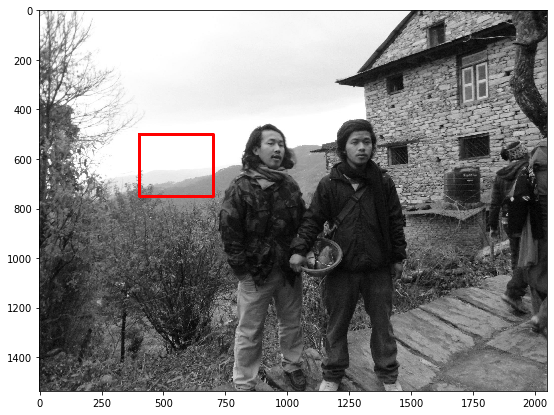

In [84]:
# use square box lining to draw line
M= np.asarray(ar)
plt.imshow(M, cmap="gray")
plt.plot([400,700, 700, 400, 400],
        [500, 500, 750, 750, 500], c='red', lw=3)
plt.gcf().set_size_inches(10,7)

In [123]:
# Zoom and analyze the pic by croping the image
# use the gray scale image
hill= gray_scale.crop(box=[400,500, 750, 750])

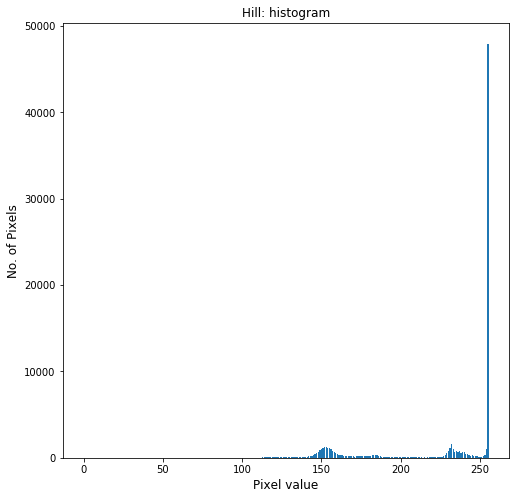

In [99]:
# USing histogram on the image
heights=hill.histogram()

#create x-value from the lenght of the range of heights
x_val= list(range(len(heights)))

# total of 256 pixels
plt.bar(x_val, heights)
plt.xlabel("Pixel value", fontsize=12)
plt.ylabel("No. of Pixels", fontsize=12)
plt.title("Hill: histogram")
plt.gcf().set_size_inches(8,8)

In [107]:
# showing the histogram more clearly with box
binheights= [sum(heights[i* 17: (i+1)* 17]) for i in range(17)]

In [109]:
binheights

[0,
 0,
 0,
 0,
 1,
 56,
 468,
 1473,
 7456,
 8980,
 3950,
 1315,
 789,
 8913,
 6142,
 47957,
 0]

Text(0, 0.5, 'No. of Pixels')

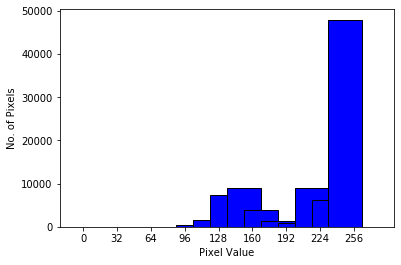

In [116]:
# make a bar graph
# here, width means the space between the bars
plt.bar(range(17), binheights, width= 2,
       edgecolor='k',
       facecolor='blue')
plt.xticks(np.array(range(0, 17, 2))- .5, range(0,257, 32));

plt.xlabel("Pixel Value")
plt.ylabel("No. of Pixels")

In [117]:
# CONTRAST the image for more detail analysis
from PIL import ImageOps

In [125]:
TEQ= ImageOps.equalize(hill)

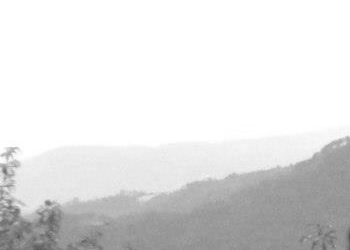

In [126]:
#original croped pic
hill

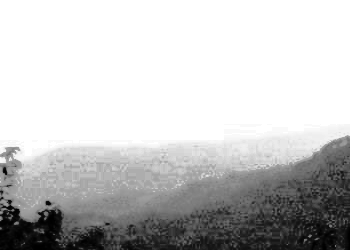

In [127]:
TEQ

In [133]:
# using histogram to plot bar chart for the contrast image

Text(0.5, 1.0, 'Trees: Equalized Histogram')

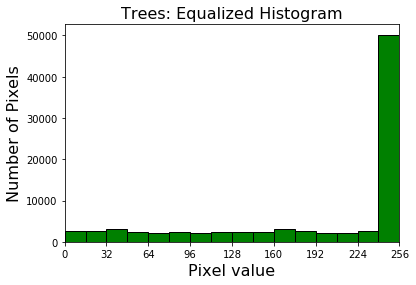

In [141]:
heights= TEQ.histogram()

# to Make GAPs between the BARs
binHeights= [sum(heights[i* 16: (i+1)* 16])
                for i in range(16)]
plt.bar(range(16), binHeights, width=1, edgecolor='k', facecolor='green')
plt.xticks(np.array(range(0,17,2))-.5,
          range(0,257,32));
plt.xlim(-.5, 15.5)
plt.xlabel("Pixel value", fontsize=16)
plt.ylabel("Number of Pixels", fontsize=16)
plt.title("Trees: Equalized Histogram", fontsize=16)

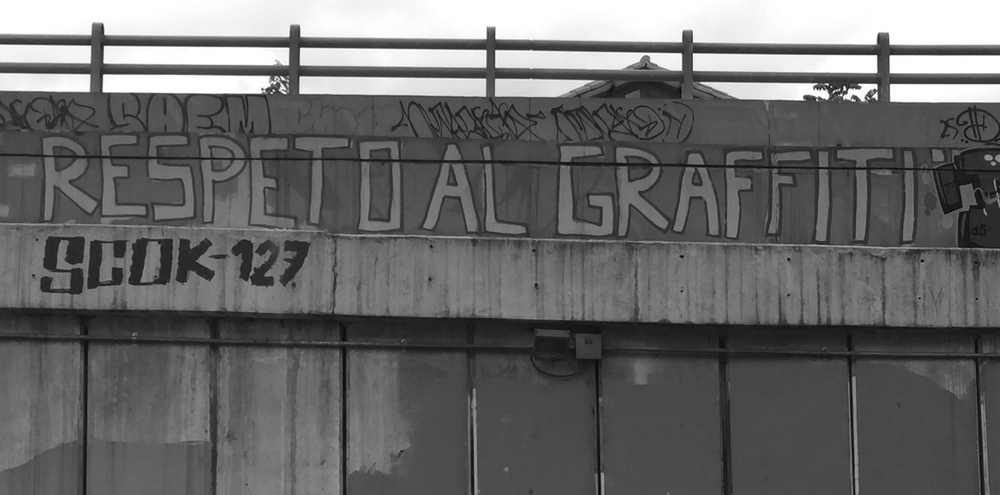

In [159]:
# use image with letters for analysis

graff=Image.open("../graffiti.jpg").convert("L")
graff

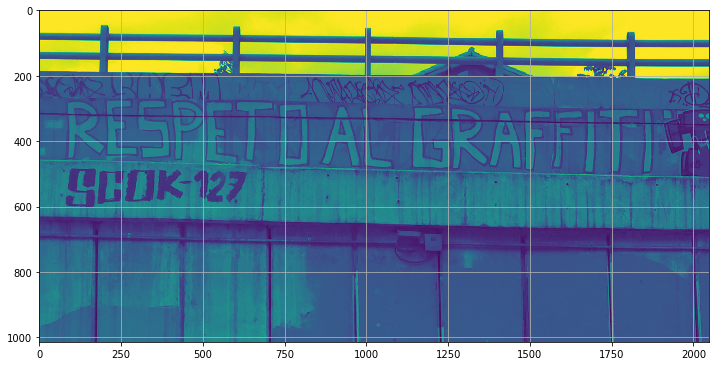

In [160]:
plt.imshow(graff)
plt.grid()
plt.gcf().set_size_inches(12,12)

In [161]:
# use EDGEfileter to find EDGES of the letters on a image
from PIL import ImageFilter

In [162]:
graff_filter=graff.filter(ImageFilter.MedianFilter(size= 7)) #FILTERING reduces the noise, i.e. LINES, words

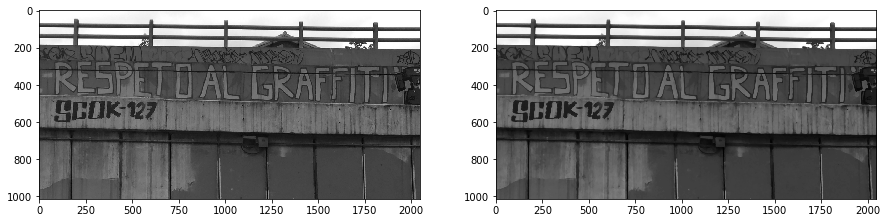

In [164]:
# now using object of fig, create subplots and plot the TWO diff images
fig, ax= plt.subplots( ncols= 2, nrows=1)

# orinial image
ax[0].imshow(np.asarray(graff), cmap="gray")
ax[1].imshow(np.asarray(graff_filter), cmap="gray")
fig.set_size_inches(15,15)

In [165]:
# FINDING the EDge of image
edge_graff=graff.filter(ImageFilter.FIND_EDGES)

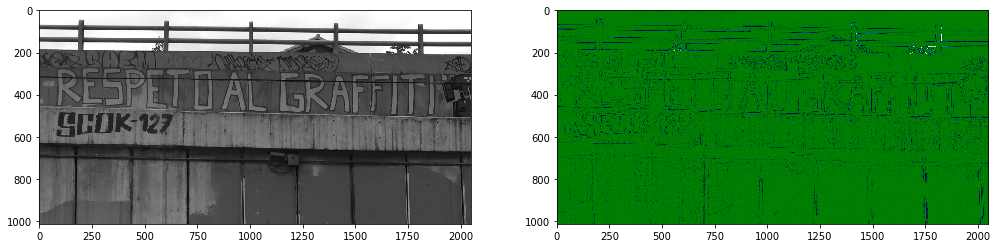

In [180]:
# Now using object do the subplots

# specify the rows and columns
fig, ax= plt.subplots(nrows=1, ncols=2)

# use the subplots for two data
ax[0].imshow(graff, cmap='gray')
ax[1].imshow(edge_graff, cmap='ocean')

fig.set_size_inches(17,17)

In [181]:
# Enhance the picture

yos=Image.open("../yosimite.jpg")

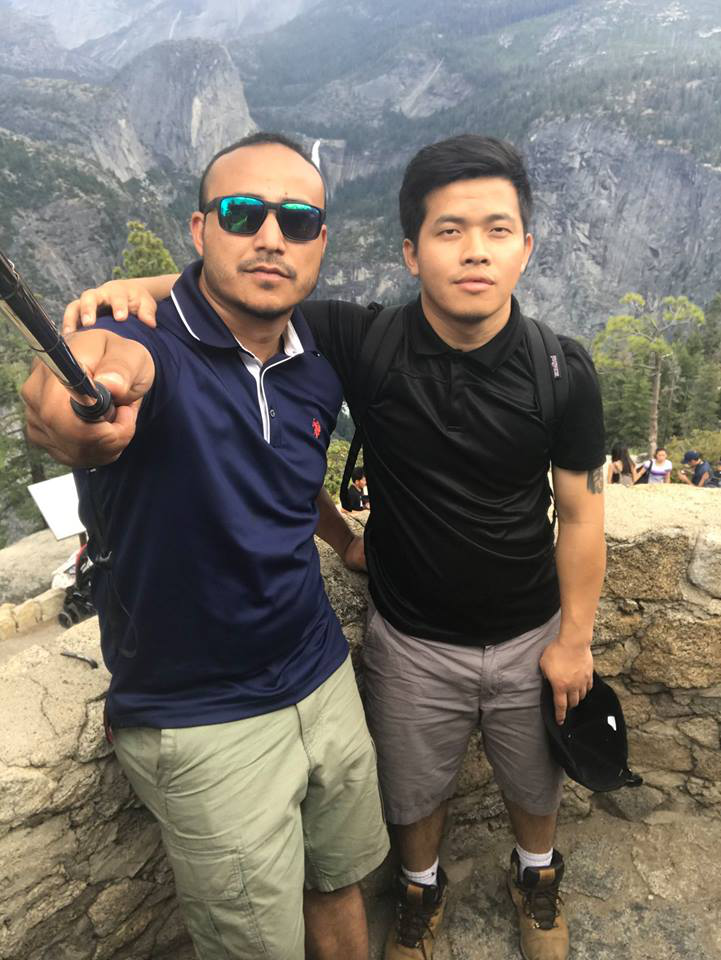

In [182]:
yos

In [183]:
# enhance the picture using IMAGE filter

yos_gray=yos.convert("L")

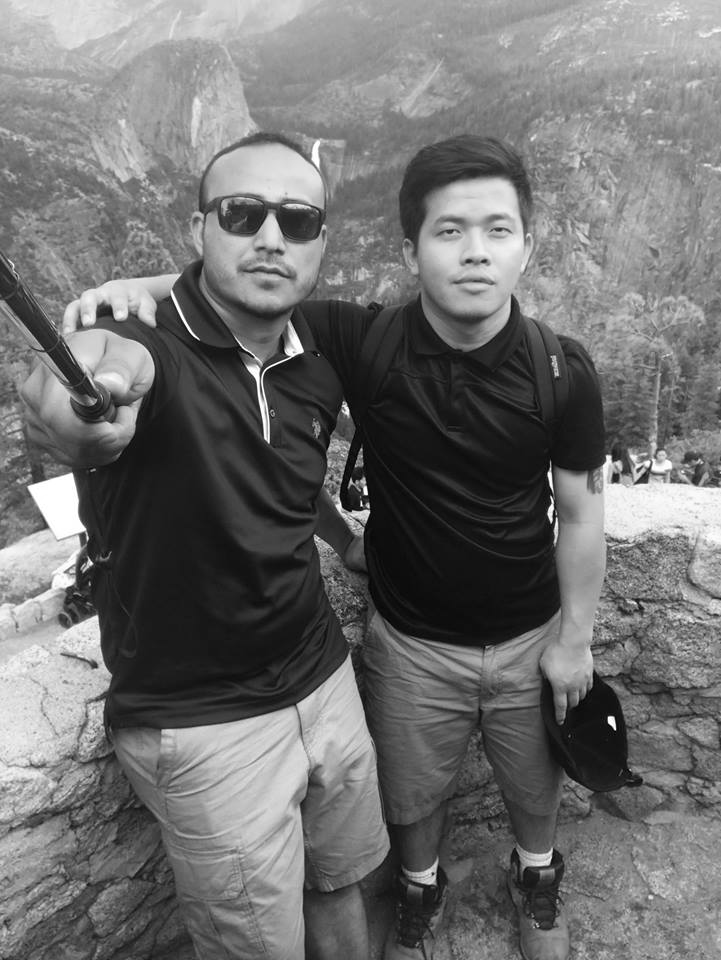

In [184]:
yos_gray

In [185]:
yos_array=np.asarray(yos)

In [187]:
yos_array

array([[[186, 200, 226],
        [186, 200, 226],
        [187, 201, 227],
        ...,
        [187, 199, 211],
        [188, 200, 212],
        [182, 201, 207]],

       [[185, 199, 225],
        [185, 199, 225],
        [186, 200, 226],
        ...,
        [186, 198, 210],
        [187, 199, 211],
        [182, 201, 207]],

       [[184, 199, 222],
        [184, 199, 222],
        [185, 200, 223],
        ...,
        [185, 197, 209],
        [185, 197, 209],
        [182, 201, 207]],

       ...,

       [[130, 123,  97],
        [105,  98,  72],
        [ 82,  75,  49],
        ...,
        [162, 146, 120],
        [164, 148, 122],
        [166, 151, 122]],

       [[132, 125,  99],
        [114, 107,  81],
        [ 73,  66,  40],
        ...,
        [161, 145, 119],
        [169, 153, 127],
        [162, 147, 118]],

       [[107, 100,  74],
        [111, 104,  78],
        [ 72,  65,  39],
        ...,
        [156, 140, 114],
        [165, 149, 123],
        [165, 150, 121]]

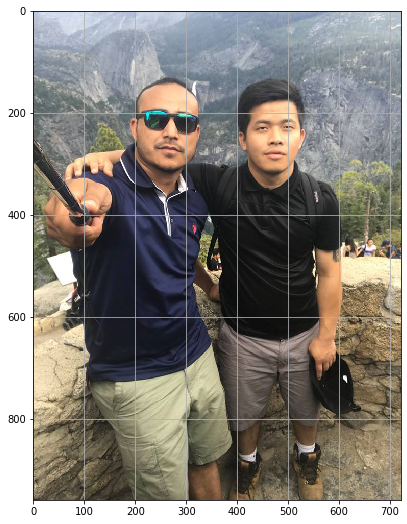

In [191]:
plt.imshow(yos)
plt.grid()
plt.gcf().set_size_inches(9,9)

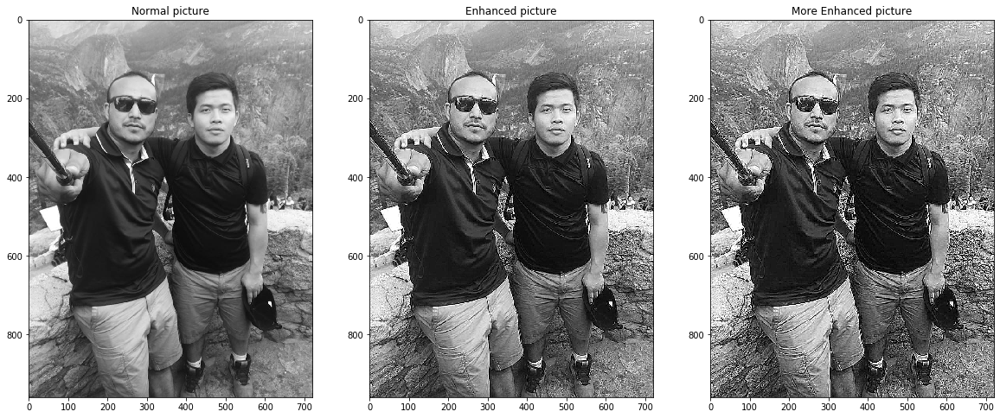

In [195]:
# convert the image to GRAYSCALE
yos_g= yos.convert("L")

# use edge_enhance, edge_enhance_more using filter image

# using fig's object to create subplots


fig, ax=plt.subplots(nrows=1, ncols=3)
ax[0].imshow(yos_g, cmap='gray')
ax[1].imshow(yos_g.filter(ImageFilter.EDGE_ENHANCE), cmap='gray')
ax[2].imshow(yos_g.filter(ImageFilter.EDGE_ENHANCE_MORE), cmap='gray')

ax[0].set_title("Normal picture", fontsize=12)
ax[1].set_title("Enhanced picture", fontsize=12)
ax[2].set_title("More Enhanced picture", fontsize=12)

fig.set_size_inches(20, 15)